# Import Libraries

In [ ]:
!pip install plotly==5.19.0

In [ ]:
! pip install plotly --upgrade

In [ ]:
pip install cufflinks

In [ ]:
!pip install cufflinks

In [ ]:
!pip install chart_studio

In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
from datetime import datetime
import seaborn as sns
import chart_studio.plotly as py
import cufflinks as cf
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

# Make Plotly work in your Jupyter Notebook
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
# Use Plotly locally
cf.go_offline()

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
warnings.filterwarnings('ignore')

# Reading CSV

In [82]:
df = pd.read_csv('/Users/parth/Downloads/car_prices.csv')
df.head()

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg566472,ca,5.0,16639.0,white,black,kia motors america inc,20500.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
1,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg561319,ca,5.0,9393.0,white,beige,kia motors america inc,20800.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,wba3c1c51ek116351,ca,45.0,1331.0,gray,black,financial services remarketing (lease),31900.0,30000.0,Thu Jan 15 2015 04:30:00 GMT-0800 (PST)
3,2015,Volvo,S60,T5,Sedan,automatic,yv1612tb4f1310987,ca,41.0,14282.0,white,black,volvo na rep/world omni,27500.0,27750.0,Thu Jan 29 2015 04:30:00 GMT-0800 (PST)
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,wba6b2c57ed129731,ca,43.0,2641.0,gray,black,financial services remarketing (lease),66000.0,67000.0,Thu Dec 18 2014 12:30:00 GMT-0800 (PST)


In [83]:
df.shape

(558837, 16)

In [84]:
df.columns

Index(['year', 'make', 'model', 'trim', 'body', 'transmission', 'vin', 'state',
       'condition', 'odometer', 'color', 'interior', 'seller', 'mmr',
       'sellingprice', 'saledate'],
      dtype='object')

In [85]:
df  =df.drop(['trim','vin'], axis = 1 )
df.head()

,year,make,model,body,transmission,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,SUV,automatic,ca,5.0,16639.0,white,black,kia motors america inc,20500.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
1,2015,Kia,Sorento,SUV,automatic,ca,5.0,9393.0,white,beige,kia motors america inc,20800.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
2,2014,BMW,3 Series,Sedan,automatic,ca,45.0,1331.0,gray,black,financial services remarketing (lease),31900.0,30000.0,Thu Jan 15 2015 04:30:00 GMT-0800 (PST)
3,2015,Volvo,S60,Sedan,automatic,ca,41.0,14282.0,white,black,volvo na rep/world omni,27500.0,27750.0,Thu Jan 29 2015 04:30:00 GMT-0800 (PST)
4,2014,BMW,6 Series Gran Coupe,Sedan,automatic,ca,43.0,2641.0,gray,black,financial services remarketing (lease),66000.0,67000.0,Thu Dec 18 2014 12:30:00 GMT-0800 (PST)


In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 558837 entries, 0 to 558836
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          558837 non-null  int64  
 1   make          548536 non-null  object 
 2   model         548438 non-null  object 
 3   body          545642 non-null  object 
 4   transmission  493485 non-null  object 
 5   state         558837 non-null  object 
 6   condition     547017 non-null  float64
 7   odometer      558743 non-null  float64
 8   color         558088 non-null  object 
 9   interior      558088 non-null  object 
 10  seller        558837 non-null  object 
 11  mmr           558799 non-null  float64
 12  sellingprice  558825 non-null  float64
 13  saledate      558825 non-null  object 
dtypes: float64(4), int64(1), object(9)
memory usage: 59.7+ MB


# Dropping Duplicates

In [87]:
df.drop_duplicates(inplace = True)
df.shape

(558837, 14)

In [88]:
df['condition'].unique()

array([ 5., 45., 41., 43.,  1., 34.,  2., 42.,  3., 48., nan, 49., 17.,
       19., 29., 38., 44., 47., 32.,  4., 25., 37., 39., 31., 28., 46.,
       36., 35., 26., 21., 22., 27., 24., 33., 23., 15., 16., 18., 12.,
       14., 11., 13.])

In [89]:
df.condition.isnull().sum()

11820

Filling Null values with Mean value

In [90]:
df['condition'].fillna(df['condition'].mean(), inplace = True)
df['condition'].isnull().sum()

0

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 558837 entries, 0 to 558836
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          558837 non-null  int64  
 1   make          548536 non-null  object 
 2   model         548438 non-null  object 
 3   body          545642 non-null  object 
 4   transmission  493485 non-null  object 
 5   state         558837 non-null  object 
 6   condition     558837 non-null  float64
 7   odometer      558743 non-null  float64
 8   color         558088 non-null  object 
 9   interior      558088 non-null  object 
 10  seller        558837 non-null  object 
 11  mmr           558799 non-null  float64
 12  sellingprice  558825 non-null  float64
 13  saledate      558825 non-null  object 
dtypes: float64(4), int64(1), object(9)
memory usage: 64.0+ MB


Droppinf Null Values

In [92]:
df.dropna(inplace=True)
df.head()

,year,make,model,body,transmission,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,SUV,automatic,ca,5.0,16639.0,white,black,kia motors america inc,20500.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
1,2015,Kia,Sorento,SUV,automatic,ca,5.0,9393.0,white,beige,kia motors america inc,20800.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
2,2014,BMW,3 Series,Sedan,automatic,ca,45.0,1331.0,gray,black,financial services remarketing (lease),31900.0,30000.0,Thu Jan 15 2015 04:30:00 GMT-0800 (PST)
3,2015,Volvo,S60,Sedan,automatic,ca,41.0,14282.0,white,black,volvo na rep/world omni,27500.0,27750.0,Thu Jan 29 2015 04:30:00 GMT-0800 (PST)
4,2014,BMW,6 Series Gran Coupe,Sedan,automatic,ca,43.0,2641.0,gray,black,financial services remarketing (lease),66000.0,67000.0,Thu Dec 18 2014 12:30:00 GMT-0800 (PST)


In [93]:
YEAR = df['year'].value_counts()

In [98]:
px.bar(YEAR, title= "Disbrution of year by production all cars")

In [95]:
MODEL_LABEL = df['model'].values
MODEL_counts = df['model'].value_counts()
MODEL_count = MODEL_counts[MODEL_counts > 2000]
MODEL_count

Altima              16493
F-150               12219
Fusion              12176
Camry               11167
Escape              10755
Focus                9666
Accord               8752
Impala               7618
3 Series             7270
Civic                7240
Grand Caravan        7037
G Sedan              6939
Corolla              6843
Explorer             6369
Malibu               6319
Silverado 1500       5868
Sonata               5867
Maxima               5565
Cruze                5430
Elantra              5398
Town and Country     5147
Edge                 5136
Mustang              4598
C-Class              4495
Equinox              4377
Sentra               4297
Taurus               4270
Rogue                4199
Jetta                4113
Charger              4050
Avenger              3805
Optima               3785
Grand Cherokee       3783
200                  3727
5 Series             3553
300                  3374
Wrangler             3179
E-Class              3109
Odyssey     

In [97]:
fig = go.Figure(data=[go.Pie(labels=MODEL_LABEL, values=MODEL_count)])
fig.update_layout(title_text='Sample Pie Chart')
fig.show()


In [104]:
px.bar(MODEL_count, title = "Distribution by production all cars")

In [100]:
df.groupby("model")["year"].sum()

model
1 Series      733974
1500         5750450
190-Class       5979
2 Series       64461
200          7502641
              ...   
mdx             2010
tC           1316617
xA             48115
xB            900197
xD            343876
Name: year, Length: 771, dtype: int64

In [101]:
MAKE = df.make.value_counts()

In [102]:
px.bar(MAKE,title= "Distribution of Make all cars")

In [109]:
MM= pd.crosstab(df.model,df["make"])

In [111]:
px.bar(MM,title= "Distribution of MM all cars")

In [113]:
BODY = df['body'].value_counts()
px.bar(BODY,title= "Distribution of BODY all cars")

In [114]:
df.columns.to_list()


['year',
 'make',
 'model',
 'body',
 'transmission',
 'state',
 'condition',
 'odometer',
 'color',
 'interior',
 'seller',
 'mmr',
 'sellingprice',
 'saledate']

In [115]:
transmission_LABEL = df['transmission'].values
transmission_LABEL

array(['automatic', 'automatic', 'automatic', ..., 'automatic',
       'automatic', 'automatic'], dtype=object)

In [116]:
transmission_counts= df['transmission'].value_counts()
transmission_counts

automatic    464863
manual        16830
Name: transmission, dtype: int64

In [117]:
px.bar(transmission_counts,title= "Distribution of BODY all cars")

In [118]:
YT = pd.crosstab(df["year"],df["transmission"])

In [119]:
px.line(YT,title= "Distribution of SY all cars")

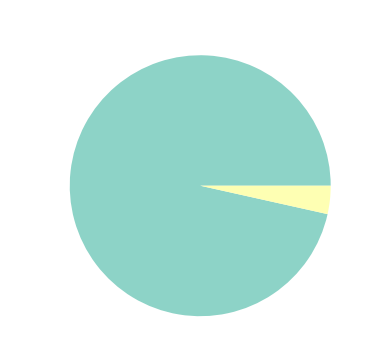

In [120]:
plt.figure(figsize=(8, 6))
transmission_counts.plot(kind='pie')
plt.title('A Number of transmission counts ')
plt.show()

In [122]:
STATE = df['state'].value_counts()
STATE

fl    76611
ca    67436
tx    42785
ga    31275
pa    24406
nj    23259
il    22325
oh    20412
tn    19192
nc    18967
mo    15423
mi    14403
nv    12010
md     9908
va     9499
wi     9380
mn     9029
az     8066
wa     7077
co     6339
ma     6233
ny     5455
in     3935
ne     3915
sc     3886
pr     2443
la     2028
ut     1766
ms     1730
hi     1209
or     1049
nm      163
ok       54
al       25
Name: state, dtype: int64

In [123]:
ST = pd.crosstab(df["state"],df["transmission"])
px.line(ST,title= "Distribution of ST all cars")

In [124]:
SM = pd.crosstab(df["state"],df["make"]).sum()
px.bar(SM,title= "Distribution of SM all cars")